In [1]:

using DifferentialEquations
using Plots
using ForwardDiff
using NLsolve
using BenchmarkTools
using DataFrames

In [2]:
# Hodgkin-Huxley parameter struct
mutable struct HHParams
    gK::Float64
    gNa::Float64
    gL::Float64
    EK::Float64
    ENa::Float64
    EL::Float64
    Tfac::Float64     # temperature factor (dimensionless)
    C::Float64
    I_stim::Float64   # stimulation current
    I_base::Float64   # base (holding) current
end


In [3]:
# Main temperature-dependent HH ODE system 
# p.I_base is for the initial value and not applied during the stimulation.
function hh!(du, u, p::HHParams, t)
    v, n, m, h = u
    du[1] = (-(p.gK * n^4 * (v - p.EK)) -
             (p.gNa * m^3 * h * (v - p.ENa)) -
             (p.gL * (v - p.EL)) +
             p.I_stim + p.I_base*0.) / p.C
    du[2] = p.Tfac * (alpha_n(v) * (1.0 - n) - beta_n(v) * n)
    du[3] = p.Tfac * (alpha_m(v) * (1.0 - m) - beta_m(v) * m)
    du[4] = p.Tfac * (alpha_h(v) * (1.0 - h) - beta_h(v) * h)
    nothing
end

hh! (generic function with 1 method)

In [4]:
function alpha_n(v)
    vred = v - V_rest
    A_n = exp((-vred+10.0)/10.0)
    return 0.01 * (-vred + 10.0) / (A_n - 1.0 + eps())
end

function beta_n(v)
    vred = v - V_rest
    return 0.125 * exp(-vred/80.0)
end

function alpha_m(v)
    vred = v - V_rest
    A_m = exp((-vred+25.0)/10.0)
    return 0.1 * (-vred + 25.0) / (A_m - 1.0 + eps())
end

function beta_m(v)
    vred = v - V_rest
    return 4.0 * exp(-vred/18.0)
end

function alpha_h(v)
    vred = v - V_rest
    return 0.07 * exp(-vred/20.0)
end

function beta_h(v)
    vred = v - V_rest
    B_h = exp((-vred+30.0)/10.0)
    return 1.0 / (B_h + 1.0 + eps())
end

temperature_factor(t) = 3^((t - 6.3) / 10)


temperature_factor (generic function with 1 method)

In [5]:
gK = 36.0
gNa = 120.0
gL = 0.3
EK = -77.0
ENa = 50.0
EL = -54.4
C = 1.

V_rest = -65.  # See to which value it converges

# Time span
tspan = (0.0, 100.0)

I = 40.
T = 6.3

6.3

In [6]:
temperature_factor(t) = 3^((t - 6.3) / 10)
n_inf(v) = alpha_n(v) / (alpha_n(v) + beta_n(v))
m_inf(v) = alpha_m(v) / (alpha_m(v) + beta_m(v))
h_inf(v) = alpha_h(v) / (alpha_h(v) + beta_h(v))

h_inf (generic function with 1 method)

In [7]:
temp_factor = temperature_factor(T)
p = HHParams(gK, gNa, gL, EK, ENa, EL, temperature_factor(T), C, I, 0.)

HHParams(36.0, 120.0, 0.3, -77.0, 50.0, -54.4, 1.0, 1.0, 40.0, 0.0)

In [8]:
# For initial condition: Find Stationary State (no stimulation) with NLsolve
function hh_stat!(u, p::HHParams)
    v, n, m, h = u
    dv = (-(p.gK * n^4 * (v - p.EK)) -
          (p.gNa * m^3 * h * (v - p.ENa)) -
          (p.gL * (v - p.EL)) +
          p.I_base) / p.C
    dn = p.Tfac * (alpha_n(v) * (1.0 - n) - beta_n(v) * n)
    dm = p.Tfac * (alpha_m(v) * (1.0 - m) - beta_m(v) * m)
    dh = p.Tfac * (alpha_h(v) * (1.0 - h) - beta_h(v) * h)
    return [dv, dn, dm, dh]
end

hh_stat! (generic function with 1 method)

In [9]:
u0_guess = [V_rest, n_inf(V_rest), m_inf(V_rest), h_inf(V_rest)]
sol_stat = nlsolve(u -> hh_stat!(u, p), u0_guess, autodiff=:forward)
u0 = sol_stat.zero

4-element Vector{Float64}:
 -64.9997224275332
   0.3176811676662185
   0.052934217634013014
   0.5961110461633801

In [10]:
# Define the problem
probODE = ODEProblem(hh!, u0, tspan, p);


In [11]:
algos = [
	# implicit
	TRBDF2(),         # stiff trapez. BDF
	Rosenbrock23(),   # Rosenbrock 2/3

	# explicit
	RK4(), # standard Runge Kutta 4
    Tsit5(),          #  RK 5
	Vern6(), # higher-order explicit RK
	Vern7(),          
	Vern8(),
    VCABM(),    # VCABM (adaptive order adaptive time Adams Moulton method)
	AutoTsit5(Rosenbrock23()) # auto switching impl/expl
]

9-element Vector{OrdinaryDiffEqAlgorithm}:
 TRBDF2{0, true, Nothing, NLNewton{Rational{Int64}, Rational{Int64}, Rational{Int64}, Rational{Int64}}, typeof(OrdinaryDiffEq.DEFAULT_PRECS), Val{:forward}, true, nothing}(nothing, NLNewton{Rational{Int64}, Rational{Int64}, Rational{Int64}, Rational{Int64}}(1//100, 10, 1//5, 1//5, false, true, 0//1), OrdinaryDiffEq.DEFAULT_PRECS, true, :linear, :PI)
 Rosenbrock23{0, true, Nothing, typeof(OrdinaryDiffEq.DEFAULT_PRECS), Val{:forward}, true, nothing}(nothing, OrdinaryDiffEq.DEFAULT_PRECS)
 RK4(stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false))
 Tsit5(stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false))
 Vern6(stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false), lazy = true)
 Vern7(stage_limiter! = trivial_limiter!, step_limiter! = trivial_limiter!, thread = static(false), lazy = true)
 Vern8(stage_limiter! = trivial_limiter!, 

In [12]:
abstols = 10.0 .^ (-3:-2:-11) # da nur testweise, abstol=reltol

5-element Vector{Float64}:
 0.001
 1.0e-5
 1.0000000000000001e-7
 1.0e-9
 1.0e-11

In [13]:
results = DataFrame(
    algo      = String[],
	tol    = Float64[],
	h = Float64[],
    median_ns = Float64[],
    mean_ns   = Float64[],
    std_ns    = Float64[],
    allocs    = Int[],
    bytes     = Int[],
);

In [14]:
stepsize_plot = plot(
    layout = (length(abstols), 1),
	background_color_legend = nothing,
    sharex = true
);

In [15]:
# Loop über die verschiedenen Toleranzen und Algorithmen
for (i, abstol) in enumerate(abstols)
    reltol = abstol   
	for alg in algos
		name_alg = string(nameof(typeof(alg)))
	    println("benchmark ", name_alg, " at abstol = ", abstol)
	
	    trial = @benchmark solve($probODE, $alg;
	                             abstol = $abstol,
	                             reltol = $reltol,
	                             save_everystep = true,
								dt=sqrt($abstol)
		) samples=10
		sol = solve(
			probODE, 
			alg; 
			abstol = abstol, 
			reltol = reltol, 
			save_everystep = true,
			dt=sqrt(abstol) # emprical guess
		)
	
		@info trial
		push!(results, (
		    name_alg,
			abstol,
			0.,
		    median(trial).time,     # median runtime (ns)
		    mean(trial).time,       # mean runtime (ns)
		    0.,#std(trial).time,        # std dev of runtime (ns)
		    trial.allocs,           # allocations per evaluation
		    trial.memory,           # bytes allocated per evaluation
		))
		
		t  = sol.t
	    Δt = diff(t)
	
        plot!(stepsize_plot,
              t[1:end-1], Δt;
              yscale  = :log10,
              xlabel  = "t",
              ylabel  = "Δt",
              label   = name_alg,
              subplot = i)
	end
	plot!(
		stepsize_plot;
		title   = "abstol = $(abstol).3f",
		size=(800, 800 * length(abstols)),
		legend =:bottomright,
		subplot = i
	)
end

benchmark TRBDF2 at abstol = 0.001


[ Info: Trial(5.652 ms)


benchmark Rosenbrock23 at abstol = 0.001
benchmark RK4 at abstol = 0.001


[ Info: Trial(28.596 ms)


benchmark Tsit5 at abstol = 0.001


[ Info: Trial(5.254 ms)


benchmark Vern6 at abstol = 0.001


[ Info: Trial(3.001 ms)


benchmark Vern7 at abstol = 0.001


[ Info: Trial(3.600 ms)


benchmark Vern8 at abstol = 0.001


[ Info: Trial(27.062 ms)


benchmark VCABM at abstol = 0.001


[ Info: Trial(16.473 ms)


benchmark CompositeAlgorithm at abstol = 0.001


[ Info: Trial(2.667 ms)
[ Info: Trial(3.093 ms)


benchmark TRBDF2 at abstol = 1.0e-5
benchmark Rosenbrock23 at abstol = 1.0e-5


[ Info: Trial(84.081 ms)


benchmark RK4 at abstol = 1.0e-5


[ Info: Trial(47.270 ms)


benchmark Tsit5 at abstol = 1.0e-5


[ Info: Trial(91.212 ms)


benchmark Vern6 at abstol = 1.0e-5


[ Info: Trial(4.120 ms)


benchmark Vern7 at abstol = 1.0e-5


[ Info: Trial(41.012 ms)


benchmark Vern8 at abstol = 1.0e-5


[ Info: Trial(5.446 ms)


benchmark VCABM at abstol = 1.0e-5


[ Info: Trial(4.564 ms)


benchmark CompositeAlgorithm at abstol = 1.0e-5


[ Info: Trial(2.923 ms)


benchmark TRBDF2 at abstol = 1.0000000000000001e-7


[ Info: Trial(4.229 ms)


benchmark Rosenbrock23 at abstol = 1.0000000000000001e-7


[ Info: Trial(185.534 ms)


benchmark RK4 at abstol = 1.0000000000000001e-7


[ Info: Trial(110.171 ms)


benchmark Tsit5 at abstol = 1.0000000000000001e-7


[ Info: Trial(24.472 ms)


benchmark Vern6 at abstol = 1.0000000000000001e-7


[ Info: Trial(9.301 ms)


benchmark Vern7 at abstol = 1.0000000000000001e-7


[ Info: Trial(37.428 ms)


benchmark Vern8 at abstol = 1.0000000000000001e-7


[ Info: Trial(73.506 ms)


benchmark VCABM at abstol = 1.0000000000000001e-7


[ Info: Trial(46.865 ms)


benchmark CompositeAlgorithm at abstol = 1.0000000000000001e-7


[ Info: Trial(12.575 ms)


benchmark TRBDF2 at abstol = 1.0e-9


[ Info: Trial(61.546 ms)


benchmark Rosenbrock23 at abstol = 1.0e-9


[ Info: Trial(810.790 ms)


benchmark RK4 at abstol = 1.0e-9


[ Info: Trial(5.359 s)


benchmark Tsit5 at abstol = 1.0e-9


[ Info: Trial(795.261 ms)


benchmark Vern6 at abstol = 1.0e-9


[ Info: Trial(52.844 ms)


benchmark Vern7 at abstol = 1.0e-9


[ Info: Trial(153.674 ms)


benchmark Vern8 at abstol = 1.0e-9


[ Info: Trial(17.700 ms)


benchmark VCABM at abstol = 1.0e-9


[ Info: Trial(112.638 ms)


benchmark CompositeAlgorithm at abstol = 1.0e-9


[ Info: Trial(41.282 ms)


benchmark TRBDF2 at abstol = 1.0e-11


[ Info: Trial(214.501 ms)


benchmark Rosenbrock23 at abstol = 1.0e-11


[ Info: Trial(2.510 s)


benchmark RK4 at abstol = 1.0e-11


[ Info: Trial(26.013 s)


benchmark Tsit5 at abstol = 1.0e-11


[ Info: Trial(243.198 ms)


benchmark Vern6 at abstol = 1.0e-11


[ Info: Trial(588.744 ms)


benchmark Vern7 at abstol = 1.0e-11


[ Info: Trial(92.108 ms)


benchmark Vern8 at abstol = 1.0e-11


[ Info: Trial(434.582 ms)


benchmark VCABM at abstol = 1.0e-11


[ Info: Trial(73.584 ms)


benchmark CompositeAlgorithm at abstol = 1.0e-11


[ Info: Trial(7.207 ms)
[ Info: Trial(58.852 ms)


In [16]:
@info results

┌ Info: 45×8 DataFrame
│  Row │ algo                tol      h        median_ns   mean_ns     std_ns   allocs     bytes
│      │ String              Float64  Float64  Float64     Float64     Float64  Int64      Int64
│ ─────┼──────────────────────────────────────────────────────────────────────────────────────────────
│    1 │ TRBDF2              0.001        0.0  7.3812e6    7.23999e6       0.0     334784     5943392
│    2 │ Rosenbrock23        0.001        0.0  5.88968e7   5.51967e7       0.0     337027     8470736
│    3 │ RK4                 0.001        0.0  4.98332e7   5.17971e7       0.0     343846     5778368
│    4 │ Tsit5               0.001        0.0  3.10204e7   2.75679e7       0.0     183956     3235680
│    5 │ Vern6               0.001        0.0  3.48571e7   3.13014e7       0.0     233253     4081952
│    6 │ Vern7               0.001        0.0  3.6485e7    4.21841e7       0.0     265263     4588768
│    7 │ Vern8               0.001        0.0  4.4044e7    4.39504e7

Könnten die impliziten Verfahren durch bessere Löser/andere Hyperparameter beschleunigt werden ?

In [17]:
markers = [:circle, :diamond, :star5, :utriangle, :x, :+, :pentagon, :rect, :cross, :dtriangle]
sort!(results, [:tol, :algo])

# Runtime
p_time = plot(
    xscale = :log10,
    yscale = :log10,
    xlabel = "tolerance",
    ylabel = "median runtime [ms]",
    title  = "Median runtime [ms] vs tolerance",
)

for (i, alg) in enumerate(algos)
	name_alg = string(nameof(typeof(alg)))
    df_alg = filter(:algo => ==(name_alg), results)
    plot!(
		p_time,
		df_alg.tol,
		df_alg.median_ns ./1000000;
		marker = markers[mod1(i, length(markers))],
		label  = name_alg,
		xflip = true
	)
		
end

# Allocations 
p_allocs = plot(
    xscale = :log10,
    yscale = :log10,
    xlabel = "tolerance",
    ylabel = "allocations per run",
    title  = "Allocations vs tolerance",
)

for (i, alg) in enumerate(algos)
	name_alg = string(nameof(typeof(alg)))
    df_alg = filter(:algo => ==(name_alg), results)
    plot!(
		p_allocs,
		df_alg.tol,
		df_alg.allocs;
		marker = markers[mod1(i, length(markers))],
		label  = name_alg,
		xflip = true
	)
end

# Bytes
p_bytes = plot(
	xscale = :log10,
	yscale = :log10,
	xlabel = "tolerance",
	ylabel = "bytes per run",
	title  = "Allocated bytes vs tolerance",
)

for (i, alg) in enumerate(algos)
	name_alg = string(nameof(typeof(alg)))
	df_alg = filter(:algo => ==(name_alg), results)
	plot!(
		p_bytes,
		df_alg.tol,
		df_alg.bytes;
		marker = markers[mod1(i, length(markers))],
		label  = name_alg,
		xflip = true
	)
end



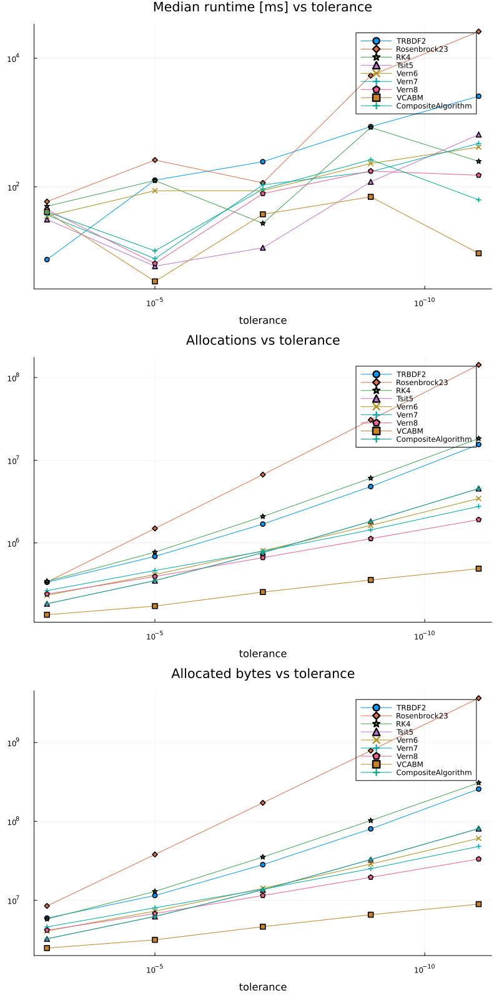

In [18]:
plot(p_time, p_allocs, p_bytes; layout = (3, 1), legend = :best, size=(800,1600),background_color_legend = nothing)

"Reference solution"

In [19]:
sol = solve(
			probODE, 
			TRBDF2(); 
			abstol = 1e-12, 
			reltol = 1e-12, 
			save_everystep = true,
			dt=sqrt(1e-5) # emprical guess
		)

retcode: Success
Interpolation: 3rd order Hermite
t: 32283-element Vector{Float64}:
   0.0
   0.00199753938017057
   0.002397047256204684
   0.00425694678365471
   0.004837843646828689
   0.006869674290218342
   0.007629483867406513
   0.009708079532962939
   0.010645719081011773
   0.012798269517608063
   0.013897777342309897
   0.016102123606487002
   0.017345784396168885
   ⋮
  99.87648257455994
  99.88906379865938
  99.90164502275881
  99.91288221598309
  99.92453781234974
  99.93619340871639
  99.94784900508304
  99.9595046014497
  99.97116019781635
  99.982815794183
  99.99447139054965
 100.0
u: 32283-element Vector{Vector{Float64}}:
 [-64.9997224275332, 0.3176811676662185, 0.052934217634013014, 0.5961110461633801]
 [-64.91987476182885, 0.31768139180185295, 0.05293631338902831, 0.5961107181931411]
 [-64.90391814650746, 0.3176814904357099, 0.05293723436500136, 0.5961105738502539]
 [-64.82968889157458, 0.3176821859396895, 0.05294370756487413, 0.5961095557813907]
 [-64.8065240744368

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


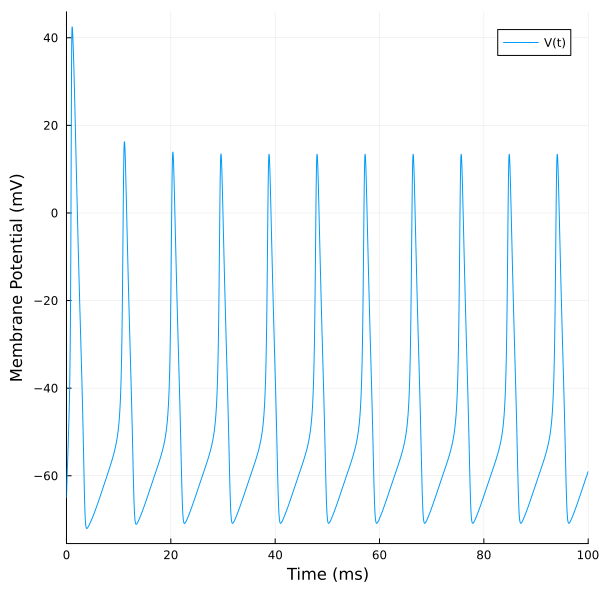

In [20]:
Plots.plot(sol, vars=(0, 1), xlabel="Time (ms)", ylabel="Membrane Potential (mV)", label="V(t)", title="", size=(600, 600), yticks=-100:20:100)#, ylims=[-0., 30.], )

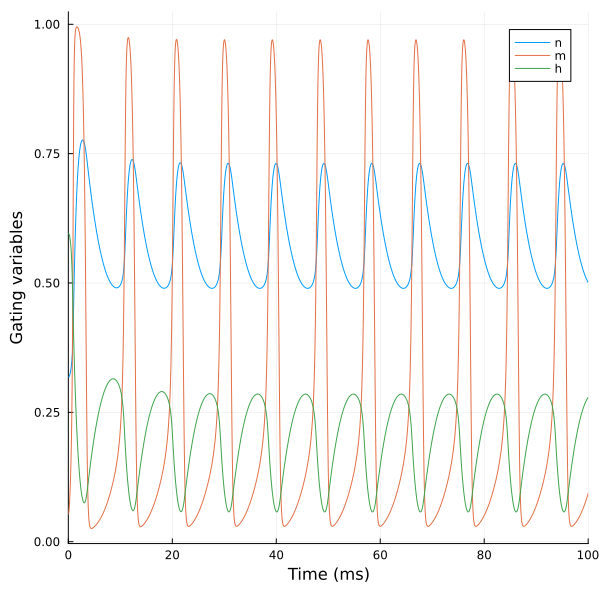

In [21]:
nmh_plot = Plots.plot(sol, vars=(2:4), xlabel="Time (ms)", ylabel="Gating variables", label=["n" "m" "h"], title="",  size=(600, 600))